In [1]:
import tensorflow as tf
tf.__version__
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 12466252816739956937,
 name: "/device:XLA_CPU:0"
 device_type: "XLA_CPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 15041845266187828571
 physical_device_desc: "device: XLA_CPU device",
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 6918604064
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 10546528988473722692
 physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 2080 SUPER, pci bus id: 0000:01:00.0, compute capability: 7.5",
 name: "/device:XLA_GPU:0"
 device_type: "XLA_GPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 436528379288470787
 physical_device_desc: "device: XLA_GPU device"]

In [2]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [3]:
tf.debugging.set_log_device_placement(True)

a = tf.constant([[1.0, 2.0, 3.0], [4.0, 5.0, 6.0]])
b = tf.constant([[1.0, 2.0], [3.0, 4.0], [5.0, 6.0]])
c = tf.matmul(a, b)
print(c)

Executing op MatMul in device /job:localhost/replica:0/task:0/device:GPU:0
tf.Tensor(
[[22. 28.]
 [49. 64.]], shape=(2, 2), dtype=float32)


In [4]:
import keras
from keras.models import Sequential, Model
from keras import layers, applications, optimizers
from keras.layers import Conv2D, MaxPool2D, AveragePooling2D, Dropout, Flatten, Dense, Activation, GlobalAveragePooling2D, GlobalMaxPooling2D, Input, concatenate
from keras.preprocessing.image import ImageDataGenerator, load_img

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import random

In [5]:
epoch = 100
batch_size = 5
image_size = 224

In [6]:
#load train data(25000 imgs each)

filenames = os.listdir('./input/train/train')
data = []
categories = []

for filename in filenames:
    category = filename.split('.')[0]
    if category == 'dog':
        categories.append(1)
    else:
        categories.append(0)
    
    image = keras.preprocessing.image.load_img(os.path.join('./input/train/train', filename),
                                               color_mode='rgb',
                                               target_size= (image_size,image_size))
    image = np.array(image)
    data.append(image)

data = np.array(data)
categories = np.array(categories)

print(data)
print(categories)

[[[[203 164  87]
   [206 167  90]
   [209 170  93]
   ...
   [245 203 119]
   [241 202 123]
   [239 200 121]]

  [[203 164  87]
   [206 167  90]
   [209 170  93]
   ...
   [245 205 120]
   [242 203 124]
   [240 201 122]]

  [[203 164  87]
   [206 167  90]
   [209 170  93]
   ...
   [245 204 122]
   [243 204 125]
   [241 202 123]]

  ...

  [[154 123  56]
   [155 124  57]
   [156 125  58]
   ...
   [  3   3   1]
   [  3   3   1]
   [  3   3   1]]

  [[153 122  55]
   [153 122  55]
   [154 123  56]
   ...
   [  2   2   0]
   [  2   2   0]
   [  2   2   0]]

  [[151 120  53]
   [152 121  54]
   [153 122  55]
   ...
   [  1   1   0]
   [  1   1   0]
   [  1   1   0]]]


 [[[ 39  44  40]
   [ 40  44  43]
   [ 41  45  46]
   ...
   [210 209 181]
   [207 204 171]
   [201 199 161]]

  [[ 40  45  41]
   [ 40  44  43]
   [ 41  45  46]
   ...
   [207 203 176]
   [203 200 169]
   [197 195 157]]

  [[ 39  44  40]
   [ 38  42  41]
   [ 37  41  42]
   ...
   [195 191 166]
   [198 193 164]
   [205 200

In [7]:
# split train 6(15,000) / val 2(5,000) / test 2(5,000)

x_train = data[15000:]
y_train = categories[15000:]
x_temp, y_temp = data[:-5000], categories[:-5000]

from sklearn.model_selection import train_test_split

x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, test_size=0.5)

print(x_train, y_train)
print(x_temp, y_temp)
print(x_test, y_test)

[[[[135 152 162]
   [135 152 162]
   [135 152 162]
   ...
   [166 179 196]
   [163 180 187]
   [165 182 189]]

  [[135 152 162]
   [135 152 162]
   [135 152 162]
   ...
   [165 178 194]
   [162 181 185]
   [164 183 187]]

  [[135 152 162]
   [135 152 162]
   [135 152 162]
   ...
   [161 179 193]
   [162 181 185]
   [164 183 187]]

  ...

  [[190 203 209]
   [182 199 206]
   [178 197 204]
   ...
   [149 151 138]
   [149 147 126]
   [144 142 121]]

  [[194 207 213]
   [185 202 209]
   [181 200 207]
   ...
   [151 153 140]
   [158 155 138]
   [150 147 130]]

  [[194 207 213]
   [191 208 215]
   [174 193 200]
   ...
   [151 153 140]
   [159 157 144]
   [153 151 138]]]


 [[[ 68  40  19]
   [ 56  33  15]
   [ 48  30  18]
   ...
   [142 118  48]
   [148 124  52]
   [156 132  60]]

  [[ 57  32  12]
   [ 49  27  13]
   [ 45  28  18]
   ...
   [128 105  35]
   [135 112  42]
   [144 122  49]]

  [[ 53  32  15]
   [ 45  27  13]
   [ 41  27  16]
   ...
   [128 105  37]
   [134 111  43]
   [143 120

In [8]:
def inception_module(x,
                     filters_1x1,
                     filters_3x3_reduce,
                     filters_3x3,
                     filters_5x5_reduce,
                     filters_5x5,
                     filters_pool_proj,
                     name=None):
    
    conv_1x1 = Conv2D(filters_1x1, (1, 1), padding='same', activation='relu', kernel_initializer=kernel_init, bias_initializer=bias_init)(x)
    
    conv_3x3 = Conv2D(filters_3x3_reduce, (1, 1), padding='same', activation='relu', kernel_initializer=kernel_init, bias_initializer=bias_init)(x)
    conv_3x3 = Conv2D(filters_3x3, (3, 3), padding='same', activation='relu', kernel_initializer=kernel_init, bias_initializer=bias_init)(conv_3x3)

    conv_5x5 = Conv2D(filters_5x5_reduce, (1, 1), padding='same', activation='relu', kernel_initializer=kernel_init, bias_initializer=bias_init)(x)
    conv_5x5 = Conv2D(filters_5x5, (5, 5), padding='same', activation='relu', kernel_initializer=kernel_init, bias_initializer=bias_init)(conv_5x5)

    pool_proj = MaxPool2D((3, 3), strides=(1, 1), padding='same')(x)
    pool_proj = Conv2D(filters_pool_proj, (1, 1), padding='same', activation='relu', kernel_initializer=kernel_init, bias_initializer=bias_init)(pool_proj)

    module = concatenate([conv_1x1, conv_3x3, conv_5x5, pool_proj], axis=3, name=name)
    
    return module

In [9]:
kernel_init = keras.initializers.glorot_uniform()
bias_init = keras.initializers.Constant(0.2)

In [10]:
input_layer = Input(shape=(image_size, image_size, 3))

x = Conv2D(64, (7, 7), padding='same', strides=(2, 2), activation='relu', name='conv_1_7x7/2', kernel_initializer=kernel_init, bias_initializer=bias_init)(input_layer)
x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_1_3x3/2')(x)
x = Conv2D(64, (1, 1), padding='same', strides=(1, 1), activation='relu', name='conv_2a_3x3/1')(x)
x = Conv2D(192, (3, 3), padding='same', strides=(1, 1), activation='relu', name='conv_2b_3x3/1')(x)
x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_2_3x3/2')(x)

x = inception_module(x,
                     filters_1x1=64,
                     filters_3x3_reduce=96,
                     filters_3x3=128,
                     filters_5x5_reduce=16,
                     filters_5x5=32,
                     filters_pool_proj=32,
                     name='inception_3a')

x = inception_module(x,
                     filters_1x1=128,
                     filters_3x3_reduce=128,
                     filters_3x3=192,
                     filters_5x5_reduce=32,
                     filters_5x5=96,
                     filters_pool_proj=64,
                     name='inception_3b')

x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_3_3x3/2')(x)

x = inception_module(x,
                     filters_1x1=192,
                     filters_3x3_reduce=96,
                     filters_3x3=208,
                     filters_5x5_reduce=16,
                     filters_5x5=48,
                     filters_pool_proj=64,
                     name='inception_4a')


x1 = AveragePooling2D((5, 5), strides=3)(x)
x1 = Conv2D(128, (1, 1), padding='same', activation='relu')(x1)
x1 = Flatten()(x1)
x1 = Dense(1024, activation='relu')(x1)
x1 = Dropout(0.7)(x1)
x1 = Dense(10, activation='softmax', name='auxilliary_output_1')(x1)

x = inception_module(x,
                     filters_1x1=160,
                     filters_3x3_reduce=112,
                     filters_3x3=224,
                     filters_5x5_reduce=24,
                     filters_5x5=64,
                     filters_pool_proj=64,
                     name='inception_4b')

x = inception_module(x,
                     filters_1x1=128,
                     filters_3x3_reduce=128,
                     filters_3x3=256,
                     filters_5x5_reduce=24,
                     filters_5x5=64,
                     filters_pool_proj=64,
                     name='inception_4c')

x = inception_module(x,
                     filters_1x1=112,
                     filters_3x3_reduce=144,
                     filters_3x3=288,
                     filters_5x5_reduce=32,
                     filters_5x5=64,
                     filters_pool_proj=64,
                     name='inception_4d')


x2 = AveragePooling2D((5, 5), strides=3)(x)
x2 = Conv2D(128, (1, 1), padding='same', activation='relu')(x2)
x2 = Flatten()(x2)
x2 = Dense(1024, activation='relu')(x2)
x2 = Dropout(0.7)(x2)
x2 = Dense(10, activation='softmax', name='auxilliary_output_2')(x2)

x = inception_module(x,
                     filters_1x1=256,
                     filters_3x3_reduce=160,
                     filters_3x3=320,
                     filters_5x5_reduce=32,
                     filters_5x5=128,
                     filters_pool_proj=128,
                     name='inception_4e')

x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_4_3x3/2')(x)

x = inception_module(x,
                     filters_1x1=256,
                     filters_3x3_reduce=160,
                     filters_3x3=320,
                     filters_5x5_reduce=32,
                     filters_5x5=128,
                     filters_pool_proj=128,
                     name='inception_5a')

x = inception_module(x,
                     filters_1x1=384,
                     filters_3x3_reduce=192,
                     filters_3x3=384,
                     filters_5x5_reduce=48,
                     filters_5x5=128,
                     filters_pool_proj=128,
                     name='inception_5b')

x = GlobalAveragePooling2D(name='avg_pool_5_3x3/1')(x)

x = Dropout(0.4)(x)

x = Dense(10, activation='softmax', name='output')(x)


Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/r

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/repli

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/r

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task

In [11]:
%load_ext tensorboard

import datetime

In [12]:
model = Model(input_layer, [x, x1, x2], name='inception_v1')

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalN

In [13]:
model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9, clipnorm=1.),
    metrics=['accuracy']
)

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:lo

In [14]:
model.summary()

Model: "inception_v1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv_1_7x7/2 (Conv2D)           (None, 112, 112, 64) 9472        input_1[0][0]                    
__________________________________________________________________________________________________
max_pool_1_3x3/2 (MaxPooling2D) (None, 56, 56, 64)   0           conv_1_7x7/2[0][0]               
__________________________________________________________________________________________________
conv_2a_3x3/1 (Conv2D)          (None, 56, 56, 64)   4160        max_pool_1_3x3/2[0][0]           
_______________________________________________________________________________________

conv2d_53 (Conv2D)              (None, 7, 7, 48)     39984       inception_5a[0][0]               
__________________________________________________________________________________________________
max_pooling2d_8 (MaxPooling2D)  (None, 7, 7, 832)    0           inception_5a[0][0]               
__________________________________________________________________________________________________
average_pooling2d (AveragePooli (None, 4, 4, 512)    0           inception_4a[0][0]               
__________________________________________________________________________________________________
average_pooling2d_1 (AveragePoo (None, 4, 4, 528)    0           inception_4d[0][0]               
__________________________________________________________________________________________________
conv2d_50 (Conv2D)              (None, 7, 7, 384)    319872      inception_5a[0][0]               
__________________________________________________________________________________________________
conv2d_52 

In [15]:
log_dir = "logs/inception/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

early_stopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', mode='min', verbose=1, save_best_only=True)

In [ ]:
# with early stopping

history = model.fit(
    x_train, y_train,
    epochs=epoch,
    validation_data=(x_val, y_val),
    #validation_steps=2500//batch_size,
    #steps_per_epoch=22500//batch_size,
    verbose=1,
    callbacks=[tensorboard_callback, early_stopping, model_checkpoint]
)

In [ ]:
%tensorboard --logdir logs/inception

In [ ]:
print(history.history)

In [ ]:
print('train loss:', history.history['loss'][-1])
print('train accuracy:', history.history['output_accuracy'][-1])

print('dev loss:', history.history['val_loss'][-1])
print('dev accuracy:', history.history['val_output_accuracy'][-1])

plt.subplot(1, 2, 1)
plt.plot(history.history['val_output_loss'])
plt.title('Val Loss')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.subplot(1, 2, 2)
plt.plot(history.history['val_output_accuracy'])
plt.title('Val Accuracy')
plt.xlabel('epoch')
plt.ylabel('acc')

plt.show()

In [16]:
# without early stopping
epoch = 50
history = model.fit(
    x_train, y_train,
    epochs=epoch,
    validation_data=(x_val, y_val),
    #validation_steps=2500//batch_size,
    #steps_per_epoch=22500//batch_size,
    verbose=1,
    callbacks=[tensorboard_callback]
)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op SummaryWriter 

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device 

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:loc

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localho

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /j

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:lo

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device 

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:loc

 28/313 [=>............................] - ETA: 18s - loss: 1.3190 - output_loss: 0.1370 - auxilliary_output_1_loss: 0.9961 - auxilliary_output_2_loss: 0.1859 - output_accuracy: 0.9643 - auxilliary_output_1_accuracy: 0.9286 - auxilliary_output_2_accuracy: 0.9621Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 50/313 [===>..........................] - ETA: 17s - loss: 0.7386 - output_loss: 0.0767 - auxilliary_output_1_loss: 0.5578 - auxilliary_output_2_loss: 0.1041 - output_accuracy: 0.9800 - auxilliary_output_1_accuracy: 0.9600 - auxilliary_output_2_accuracy: 0.9787Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 72/313 [=====>........................] - ETA: 15s - loss: 0.5129 - output_loss: 0.0533 - auxilliary_output_1_loss: 0.3874 - auxilliary_output_2_loss: 0.0723 - output_accuracy: 0.9861 - auxilliary_output_1_accuracy: 0.9722 - auxilliary_output_2_accuracy: 0.9852Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 94/313 [========>.....................] - ETA: 14s - loss: 0.3929 - output_loss: 0.0408 - auxilliary_output_1_loss: 0.2967 - auxilliary_output_2_loss: 0.0554 - output_accuracy: 0.9894 - auxilliary_output_1_accuracy: 0.9787 - auxilliary_output_2_accuracy: 0.9887Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


116/313 [==========>...................] - ETA: 12s - loss: 0.3184 - output_loss: 0.0331 - auxilliary_output_1_loss: 0.2404 - auxilliary_output_2_loss: 0.0449 - output_accuracy: 0.9914 - auxilliary_output_1_accuracy: 0.9828 - auxilliary_output_2_accuracy: 0.9908Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


138/313 [============>.................] - ETA: 11s - loss: 0.2676 - output_loss: 0.0278 - auxilliary_output_1_loss: 0.2021 - auxilliary_output_2_loss: 0.0377 - output_accuracy: 0.9928 - auxilliary_output_1_accuracy: 0.9855 - auxilliary_output_2_accuracy: 0.9923Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


160/313 [==============>...............] - ETA: 10s - loss: 0.2308 - output_loss: 0.0240 - auxilliary_output_1_loss: 0.1743 - auxilliary_output_2_loss: 0.0325 - output_accuracy: 0.9937 - auxilliary_output_1_accuracy: 0.9875 - auxilliary_output_2_accuracy: 0.9934Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


182/313 [================>.............] - ETA: 8s - loss: 0.2029 - output_loss: 0.0211 - auxilliary_output_1_loss: 0.1532 - auxilliary_output_2_loss: 0.0286 - output_accuracy: 0.9945 - auxilliary_output_1_accuracy: 0.9890 - auxilliary_output_2_accuracy: 0.9942Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


204/313 [==================>...........] - ETA: 7s - loss: 0.1810 - output_loss: 0.0188 - auxilliary_output_1_loss: 0.1367 - auxilliary_output_2_loss: 0.0255 - output_accuracy: 0.9951 - auxilliary_output_1_accuracy: 0.9902 - auxilliary_output_2_accuracy: 0.9948Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


226/313 [====================>.........] - ETA: 5s - loss: 0.1634 - output_loss: 0.0170 - auxilliary_output_1_loss: 0.1234 - auxilliary_output_2_loss: 0.0230 - output_accuracy: 0.9956 - auxilliary_output_1_accuracy: 0.9912 - auxilliary_output_2_accuracy: 0.9953Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


248/313 [======================>.......] - ETA: 4s - loss: 0.1489 - output_loss: 0.0155 - auxilliary_output_1_loss: 0.1125 - auxilliary_output_2_loss: 0.0210 - output_accuracy: 0.9960 - auxilliary_output_1_accuracy: 0.9919 - auxilliary_output_2_accuracy: 0.9957Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


270/313 [========================>.....] - ETA: 2s - loss: 0.1368 - output_loss: 0.0142 - auxilliary_output_1_loss: 0.1033 - auxilliary_output_2_loss: 0.0193 - output_accuracy: 0.9963 - auxilliary_output_1_accuracy: 0.9926 - auxilliary_output_2_accuracy: 0.9961Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


292/313 [==========================>...] - ETA: 1s - loss: 0.1265 - output_loss: 0.0131 - auxilliary_output_1_loss: 0.0955 - auxilliary_output_2_loss: 0.0178 - output_accuracy: 0.9966 - auxilliary_output_1_accuracy: 0.9932 - auxilliary_output_2_accuracy: 0.9964Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


313/313 [==============================] - ETA: 0s - loss: 0.1182 - output_loss: 0.0123 - auxilliary_output_1_loss: 0.0892 - auxilliary_output_2_loss: 0.0167 - output_accuracy: 0.9968 - auxilliary_output_1_accuracy: 0.9936 - auxilliary_output_2_accuracy: 0.9966Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op SummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op CreateSummaryFileWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Execut

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:C

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 23/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 44/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 65/313 [=====>........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 86/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


107/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


128/313 [===========>..................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


149/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


170/313 [===============>..............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


191/313 [=================>............] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


212/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


233/313 [=====================>........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


254/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


275/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


296/313 [===========================>..] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in dev

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 31/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 52/313 [===>..........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 73/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 94/313 [========>.....................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


115/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


136/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


157/313 [==============>...............] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


178/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


199/313 [==================>...........] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


220/313 [====================>.........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


241/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


262/313 [========================>.....] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


283/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


304/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

 39/313 [==>...........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 61/313 [====>.........................] - ETA: 16s - loss: 9.6316e-04 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 9.6316e-04 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 0.9995Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 82/313 [======>.......................] - ETA: 15s - loss: 7.1649e-04 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 7.1649e-04 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 0.9996Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


103/313 [========>.....................] - ETA: 13s - loss: 5.7041e-04 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 5.7041e-04 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 0.9997Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


124/313 [==========>...................] - ETA: 12s - loss: 4.7381e-04 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 4.7381e-04 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 0.9997Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


145/313 [============>.................] - ETA: 10s - loss: 4.0519e-04 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 4.0519e-04 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 0.9998Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


166/313 [==============>...............] - ETA: 9s - loss: 3.5393e-04 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 3.5393e-04 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 0.9998Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


187/313 [================>.............] - ETA: 8s - loss: 3.1418e-04 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 3.1418e-04 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 0.9998Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


208/313 [==================>...........] - ETA: 6s - loss: 2.8246e-04 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 2.8246e-04 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 0.9998Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


229/313 [====================>.........] - ETA: 5s - loss: 2.5656e-04 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 2.5656e-04 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 0.9999Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


250/313 [======================>.......] - ETA: 4s - loss: 2.3501e-04 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 2.3501e-04 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 0.9999Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


271/313 [========================>.....] - ETA: 2s - loss: 2.1680e-04 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 2.1680e-04 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 0.9999Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


292/313 [==========================>...] - ETA: 1s - loss: 2.0121e-04 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 2.0121e-04 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 0.9999Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 1.8831e-04 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 1.8831e-04 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 0.9999Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in de

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 27/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 48/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 69/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 90/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


111/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


132/313 [===========>..................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


153/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


174/313 [===============>..............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


195/313 [=================>............] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


216/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


237/313 [=====================>........] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


258/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


279/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


300/313 [===========================>..] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Execu

 35/313 [==>...........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 56/313 [====>.........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 77/313 [======>.......................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 98/313 [========>.....................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


119/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


140/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


161/313 [==============>...............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000 Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


182/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


203/313 [==================>...........] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


224/313 [====================>.........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


245/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


266/313 [========================>.....] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


287/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


308/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 21/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 42/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 63/313 [=====>........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 84/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


105/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


126/313 [===========>..................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


147/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


168/313 [===============>..............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


189/313 [=================>............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


210/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


231/313 [=====================>........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


252/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


273/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


294/313 [===========================>..] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 29/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 50/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 71/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 92/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


113/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


134/313 [===========>..................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


155/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


176/313 [===============>..............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


197/313 [=================>............] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


218/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


239/313 [=====================>........] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


260/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


281/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


302/313 [===========================>..] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
313/313 [==============================] - 27s 87ms/step - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000 - val_loss: 576.9474 - val_output_loss: 163.8644 - val_auxilliary_output_1_loss: 172.7203 - val_auxilliary_output_2_loss: 240.3625 - val_output_accuracy: 0.3718 - val_auxilliary_output_1_accuracy: 0.3718 - val_auxilliary_output_2_accuracy: 0.3718
Executing op AssignVariableOp in device /job:

 36/313 [==>...........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 57/313 [====>.........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 78/313 [======>.......................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 99/313 [========>.....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


120/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


141/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


162/313 [==============>...............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


183/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


204/313 [==================>...........] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


225/313 [====================>.........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


246/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


267/313 [========================>.....] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


288/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


309/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 22/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 43/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 64/313 [=====>........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 85/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


106/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


127/313 [===========>..................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


148/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


169/313 [===============>..............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


190/313 [=================>............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


211/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


232/313 [=====================>........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


253/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


274/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


295/313 [===========================>..] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in d

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 30/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 51/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 72/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 93/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


114/313 [=========>....................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


135/313 [===========>..................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


156/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


177/313 [===============>..............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


198/313 [=================>............] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


219/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


240/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


261/313 [========================>.....] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


282/313 [==========================>...] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


303/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

313/313 [==============================] - 27s 87ms/step - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000 - val_loss: 576.9474 - val_output_loss: 163.8644 - val_auxilliary_output_1_loss: 172.7203 - val_auxilliary_output_2_loss: 240.3625 - val_output_accuracy: 0.3718 - val_auxilliary_output_1_accuracy: 0.3718 - val_auxilliary_output_2_accuracy: 0.3718
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job

 38/313 [==>...........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 59/313 [====>.........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 80/313 [======>.......................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


101/313 [========>.....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


122/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


143/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


164/313 [==============>...............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


185/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


206/313 [==================>...........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


227/313 [====================>.........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


248/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


269/313 [========================>.....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


290/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


311/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in devi

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 24/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 45/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 66/313 [=====>........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 87/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


108/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


129/313 [===========>..................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


150/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


171/313 [===============>..............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


192/313 [=================>............] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


213/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


234/313 [=====================>........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


255/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


276/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


297/313 [===========================>..] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 31/313 [=>............................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 52/313 [===>..........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 73/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 94/313 [========>.....................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


115/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


136/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


157/313 [==============>...............] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


178/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


199/313 [==================>...........] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


220/313 [====================>.........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


241/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


262/313 [========================>.....] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


283/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


304/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

 39/313 [==>...........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 60/313 [====>.........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 81/313 [======>.......................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


102/313 [========>.....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


123/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


144/313 [============>.................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


165/313 [==============>...............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


186/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


207/313 [==================>...........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


228/313 [====================>.........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


249/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


270/313 [========================>.....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


291/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in dev

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 26/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 47/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 68/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 89/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


110/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


131/313 [===========>..................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


152/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


173/313 [===============>..............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


194/313 [=================>............] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


215/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


236/313 [=====================>........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


257/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


278/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


299/313 [===========================>..] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 34/313 [==>...........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 55/313 [====>.........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 76/313 [======>.......................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 97/313 [========>.....................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


118/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


139/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


160/313 [==============>...............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000 Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


181/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


202/313 [==================>...........] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


223/313 [====================>.........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


244/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


265/313 [========================>.....] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


286/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


307/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 18/50
Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
 21/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 42/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 63/313 [=====>........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 84/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


105/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


126/313 [===========>..................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


147/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


168/313 [===============>..............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


189/313 [=================>............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


210/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


231/313 [=====================>........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


252/313 [=======================>......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


273/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


294/313 [===========================>..] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 29/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 50/313 [===>..........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 71/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 92/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


113/313 [=========>....................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


134/313 [===========>..................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


155/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


176/313 [===============>..............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


197/313 [=================>............] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


218/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


239/313 [=====================>........] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


260/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


281/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


302/313 [===========================>..] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
313/313 [==============================] - 27s 87ms/step - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000 - val_loss: 576.9474 - val_output_loss: 163.8644 - val_auxilliary_output_1_loss: 172.7203 - val_auxilliary_output_2_loss: 240.3625 - val_output_accuracy: 0.3718 - val_auxilliary_output_1_accuracy: 0.3718 - val_auxilliary_output_2_accuracy: 0.3718
Executing op AssignVariableOp in device /job:

 36/313 [==>...........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 57/313 [====>.........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 78/313 [======>.......................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 99/313 [========>.....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


120/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


141/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


162/313 [==============>...............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


183/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


204/313 [==================>...........] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


225/313 [====================>.........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


246/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


267/313 [========================>.....] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


288/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


309/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 22/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 43/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 64/313 [=====>........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 85/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


106/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


127/313 [===========>..................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


148/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


169/313 [===============>..............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


190/313 [=================>............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


211/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


232/313 [=====================>........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


253/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


274/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


295/313 [===========================>..] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in d

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 30/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 51/313 [===>..........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 72/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 93/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


114/313 [=========>....................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


135/313 [===========>..................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


156/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


177/313 [===============>..............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


198/313 [=================>............] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


219/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


240/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


261/313 [========================>.....] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


282/313 [==========================>...] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


303/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

313/313 [==============================] - 27s 87ms/step - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000 - val_loss: 576.9474 - val_output_loss: 163.8644 - val_auxilliary_output_1_loss: 172.7203 - val_auxilliary_output_2_loss: 240.3625 - val_output_accuracy: 0.3718 - val_auxilliary_output_1_accuracy: 0.3718 - val_auxilliary_output_2_accuracy: 0.3718
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job

 38/313 [==>...........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 59/313 [====>.........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 80/313 [======>.......................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


101/313 [========>.....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


122/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


143/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


164/313 [==============>...............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


185/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


206/313 [==================>...........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


227/313 [====================>.........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


248/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


269/313 [========================>.....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


290/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


311/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in devi

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 24/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 45/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 66/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 87/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


108/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


129/313 [===========>..................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


150/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


171/313 [===============>..............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


192/313 [=================>............] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


213/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


234/313 [=====================>........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


255/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


276/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


297/313 [===========================>..] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 31/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 52/313 [===>..........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 73/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 94/313 [========>.....................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


115/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


136/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


157/313 [==============>...............] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


178/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


199/313 [==================>...........] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


220/313 [====================>.........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


241/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


262/313 [========================>.....] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


283/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


304/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

 39/313 [==>...........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 60/313 [====>.........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 81/313 [======>.......................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


102/313 [========>.....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


123/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


144/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


165/313 [==============>...............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


186/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


207/313 [==================>...........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


228/313 [====================>.........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


249/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


270/313 [========================>.....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


291/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in dev

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 26/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 47/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 68/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 89/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


110/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


131/313 [===========>..................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


152/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


173/313 [===============>..............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


194/313 [=================>............] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


215/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


236/313 [=====================>........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


257/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


278/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


299/313 [===========================>..] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 34/313 [==>...........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 55/313 [====>.........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 76/313 [======>.......................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 97/313 [========>.....................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


118/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


139/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


160/313 [==============>...............] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


181/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


202/313 [==================>...........] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


223/313 [====================>.........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


244/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


265/313 [========================>.....] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


286/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


307/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 29/50
Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
 21/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 42/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 63/313 [=====>........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 84/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


105/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


126/313 [===========>..................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


147/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


168/313 [===============>..............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


189/313 [=================>............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


210/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


231/313 [=====================>........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


252/313 [=======================>......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


273/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


294/313 [===========================>..] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 29/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 50/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 71/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 92/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


113/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


134/313 [===========>..................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


155/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


176/313 [===============>..............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


197/313 [=================>............] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


218/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


239/313 [=====================>........] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


260/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


281/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


302/313 [===========================>..] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
313/313 [==============================] - 27s 87ms/step - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000 - val_loss: 576.9474 - val_output_loss: 163.8644 - val_auxilliary_output_1_loss: 172.7203 - val_auxilliary_output_2_loss: 240.3625 - val_output_accuracy: 0.3718 - val_auxilliary_output_1_accuracy: 0.3718 - val_auxilliary_output_2_accuracy: 0.3718
Executing op AssignVariableOp in device /job:

 36/313 [==>...........................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 57/313 [====>.........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 78/313 [======>.......................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 99/313 [========>.....................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


120/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


141/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


162/313 [==============>...............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000 Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


183/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


204/313 [==================>...........] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


225/313 [====================>.........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


246/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


267/313 [========================>.....] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


288/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


309/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 22/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 43/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 64/313 [=====>........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 85/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


106/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


127/313 [===========>..................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


148/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


169/313 [===============>..............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


190/313 [=================>............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


211/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


232/313 [=====================>........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


253/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


274/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


295/313 [===========================>..] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in d

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 30/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 51/313 [===>..........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 72/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 93/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


114/313 [=========>....................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


135/313 [===========>..................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


156/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


177/313 [===============>..............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


198/313 [=================>............] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


219/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


240/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


261/313 [========================>.....] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


282/313 [==========================>...] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


303/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

313/313 [==============================] - 28s 88ms/step - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000 - val_loss: 576.9474 - val_output_loss: 163.8644 - val_auxilliary_output_1_loss: 172.7203 - val_auxilliary_output_2_loss: 240.3625 - val_output_accuracy: 0.3718 - val_auxilliary_output_1_accuracy: 0.3718 - val_auxilliary_output_2_accuracy: 0.3718
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job

 38/313 [==>...........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 59/313 [====>.........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 80/313 [======>.......................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


101/313 [========>.....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


122/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


143/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


164/313 [==============>...............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


185/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


206/313 [==================>...........] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


227/313 [====================>.........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


248/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


269/313 [========================>.....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


290/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


311/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in devi

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 24/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 45/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 66/313 [=====>........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 87/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


108/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


129/313 [===========>..................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


150/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


171/313 [===============>..............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


192/313 [=================>............] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


213/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


234/313 [=====================>........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


255/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


276/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


297/313 [===========================>..] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 31/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 52/313 [===>..........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 73/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 94/313 [========>.....................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


115/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


136/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


157/313 [==============>...............] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


178/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


199/313 [==================>...........] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


220/313 [====================>.........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


241/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


262/313 [========================>.....] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


283/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


304/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

 39/313 [==>...........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 60/313 [====>.........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 81/313 [======>.......................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


102/313 [========>.....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


123/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


144/313 [============>.................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


165/313 [==============>...............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


186/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


207/313 [==================>...........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


228/313 [====================>.........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


249/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


270/313 [========================>.....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


291/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in dev

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 26/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 47/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 68/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 89/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


110/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


131/313 [===========>..................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


152/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


173/313 [===============>..............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


194/313 [=================>............] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


215/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


236/313 [=====================>........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


257/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


278/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


299/313 [===========================>..] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 34/313 [==>...........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 55/313 [====>.........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 76/313 [======>.......................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 97/313 [========>.....................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


118/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


139/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


160/313 [==============>...............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000 Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


181/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


202/313 [==================>...........] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


223/313 [====================>.........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


244/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


265/313 [========================>.....] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


286/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


307/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 40/50
Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
 21/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 42/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 63/313 [=====>........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 84/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


105/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


126/313 [===========>..................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


147/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


168/313 [===============>..............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


189/313 [=================>............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


210/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


231/313 [=====================>........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


252/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


273/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


294/313 [===========================>..] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 29/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 50/313 [===>..........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 71/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 92/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


113/313 [=========>....................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


134/313 [===========>..................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


155/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


176/313 [===============>..............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


197/313 [=================>............] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


218/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


239/313 [=====================>........] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


260/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


281/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


302/313 [===========================>..] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
313/313 [==============================] - 27s 87ms/step - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000 - val_loss: 576.9474 - val_output_loss: 163.8644 - val_auxilliary_output_1_loss: 172.7203 - val_auxilliary_output_2_loss: 240.3625 - val_output_accuracy: 0.3718 - val_auxilliary_output_1_accuracy: 0.3718 - val_auxilliary_output_2_accuracy: 0.3718
Executing op AssignVariableOp in device /job:

 36/313 [==>...........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 57/313 [====>.........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 78/313 [======>.......................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 99/313 [========>.....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


120/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


141/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


162/313 [==============>...............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


183/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


204/313 [==================>...........] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


225/313 [====================>.........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


246/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


267/313 [========================>.....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


288/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


309/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 22/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 43/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 64/313 [=====>........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 85/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


106/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


127/313 [===========>..................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


148/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


169/313 [===============>..............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


190/313 [=================>............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


211/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


232/313 [=====================>........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


253/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


274/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


295/313 [===========================>..] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in d

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 30/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 51/313 [===>..........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 72/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 93/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


114/313 [=========>....................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


135/313 [===========>..................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


156/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


177/313 [===============>..............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


198/313 [=================>............] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


219/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


240/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


261/313 [========================>.....] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


282/313 [==========================>...] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


303/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

313/313 [==============================] - 27s 87ms/step - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000 - val_loss: 576.9474 - val_output_loss: 163.8644 - val_auxilliary_output_1_loss: 172.7203 - val_auxilliary_output_2_loss: 240.3625 - val_output_accuracy: 0.3718 - val_auxilliary_output_1_accuracy: 0.3718 - val_auxilliary_output_2_accuracy: 0.3718
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job

 38/313 [==>...........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 59/313 [====>.........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 80/313 [======>.......................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


101/313 [========>.....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


122/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


143/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


164/313 [==============>...............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


185/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


206/313 [==================>...........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


227/313 [====================>.........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


248/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


269/313 [========================>.....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


290/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


311/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in devi

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 24/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 45/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 66/313 [=====>........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 87/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


108/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


129/313 [===========>..................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


150/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


171/313 [===============>..............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


192/313 [=================>............] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


213/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


234/313 [=====================>........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


255/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


276/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


297/313 [===========================>..] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 31/313 [=>............................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 52/313 [===>..........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 73/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 94/313 [========>.....................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


115/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


136/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


157/313 [==============>...............] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


178/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


199/313 [==================>...........] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


220/313 [====================>.........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


241/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


262/313 [========================>.....] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


283/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


304/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

 39/313 [==>...........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 60/313 [====>.........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 81/313 [======>.......................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


102/313 [========>.....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


123/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


144/313 [============>.................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


165/313 [==============>...............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


186/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


207/313 [==================>...........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


228/313 [====================>.........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


249/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


270/313 [========================>.....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


291/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in dev

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 26/313 [=>............................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 47/313 [===>..........................] - ETA: 17s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 68/313 [=====>........................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 89/313 [=======>......................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


110/313 [=========>....................] - ETA: 13s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


131/313 [===========>..................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


152/313 [=============>................] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


173/313 [===============>..............] - ETA: 9s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


194/313 [=================>............] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


215/313 [===================>..........] - ETA: 6s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


236/313 [=====================>........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


257/313 [=======================>......] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


278/313 [=========================>....] - ETA: 2s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


299/313 [===========================>..] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 34/313 [==>...........................] - ETA: 18s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 55/313 [====>.........................] - ETA: 16s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 76/313 [======>.......................] - ETA: 15s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 97/313 [========>.....................] - ETA: 14s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


118/313 [==========>...................] - ETA: 12s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


139/313 [============>.................] - ETA: 11s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


160/313 [==============>...............] - ETA: 10s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


181/313 [================>.............] - ETA: 8s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


202/313 [==================>...........] - ETA: 7s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


223/313 [====================>.........] - ETA: 5s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


244/313 [======================>.......] - ETA: 4s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


265/313 [========================>.....] - ETA: 3s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


286/313 [==========================>...] - ETA: 1s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


307/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


312/313 [============================>.] - ETA: 0s - loss: 0.0000e+00 - output_loss: 0.0000e+00 - auxilliary_output_1_loss: 0.0000e+00 - auxilliary_output_2_loss: 0.0000e+00 - output_accuracy: 1.0000 - auxilliary_output_1_accuracy: 1.0000 - auxilliary_output_2_accuracy: 1.0000Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_13427 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

In [17]:
%tensorboard --logdir logs/inception

Reusing TensorBoard on port 6006 (pid 18180), started 1:42:52 ago. (Use '!kill 18180' to kill it.)

train loss: 0.0
train accuracy: 1.0
dev loss: 576.9473876953125
dev accuracy: 0.3718000054359436


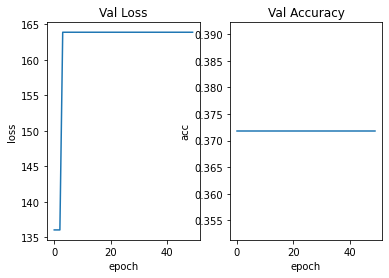

In [18]:
print('train loss:', history.history['loss'][-1])
print('train accuracy:', history.history['output_accuracy'][-1])

print('dev loss:', history.history['val_loss'][-1])
print('dev accuracy:', history.history['val_output_accuracy'][-1])

plt.subplot(1, 2, 1)
plt.plot(history.history['val_output_loss'])
plt.title('Val Loss')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.subplot(1, 2, 2)
plt.plot(history.history['val_output_accuracy'])
plt.title('Val Accuracy')
plt.xlabel('epoch')
plt.ylabel('acc')

plt.show()